# **Image Captioning** 

Team Members:

1. Adarsh Rajesh

2. Durba Satpathi

3. Shubham Priyank



# Mount the drive

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')


Mounted at /content/gdrive


# Unzip the contents of dataset

In [ ]:
!unzip gdrive/My\ Drive/Dataset/Flickr.zip

Streaming output truncated to the last 5000 lines.
  inflating: Images/2844846111_8c1cbfc75d.jpg  
  inflating: Images/2844963839_ff09cdb81f.jpg  
  inflating: Images/2845246160_d0d1bbd6f0.jpg  
  inflating: Images/2845691057_d4ab89d889.jpg  
  inflating: Images/2845845721_d0bc113ff7.jpg  
  inflating: Images/2846037553_1a1de50709.jpg  
  inflating: Images/2846785268_904c5fcf9f.jpg  
  inflating: Images/2846843520_b0e6211478.jpg  
  inflating: Images/2847514745_9a35493023.jpg  
  inflating: Images/2847615962_c330bded6e.jpg  
  inflating: Images/2847859796_4d9cb0d31f.jpg  
  inflating: Images/2848266893_9693c66275.jpg  
  inflating: Images/2848571082_26454cb981.jpg  
  inflating: Images/2848895544_6d06210e9d.jpg  
  inflating: Images/2848977044_446a31d86e.jpg  
  inflating: Images/2849194983_2968c72832.jpg  
  inflating: Images/2850719435_221f15e951.jpg  
  inflating: Images/2851198725_37b6027625.jpg  
  inflating: Images/2851304910_b5721199bc.jpg  
  inflating: Images/2851931813_eaf8ed

# Import necessary libraries

In [ ]:
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import string
import time
import re
import math

import pickle
from pickle import load,dump
from collections import Counter

from PIL import Image
import multiprocessing

import torch
import torch.nn as nn
from torch.autograd import Variable
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F
import torch.optim as optim
from torch.nn.utils.rnn import pack_padded_sequence
from torch.utils.tensorboard import SummaryWriter


from tqdm.notebook import tqdm


import torchvision
import torchvision.models as models
from torchvision import transforms

from torchtext.data.metrics import bleu_score
import random
import cv2
no_of_cpu = multiprocessing.cpu_count()
print('Number of CPUs: '+str(no_of_cpu))

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

Number of CPUs: 2
cuda


# Dataset Preparation

In [ ]:
def get_vocab(data):
    #remove punctuations,adds start and end tokens ,split sentences to words
    data['clean_data'] = data['caption'].apply(lambda caption : ['<START>'] + [re.sub(r'[^\w\s]','',word).lower() if word.isalpha() else '' for word in caption.split(" ")] + ['<END>']) 
    #remove null strings
    for i in range(data.shape[0]):
        test_list=data['clean_data'][i]
        while('' in test_list) :
            test_list.remove('')
        data['clean_data'][i]=test_list
    #get the length of the longest caption
    maxLen=data.clean_data.map(len).max()
    #make all captions of equal length by adding (max length-sentence length) num pad tokens 
    data['clean_data']=data['clean_data'].apply(lambda text : text + ['<Aspace>']*(maxLen-len(text)) )
    #get the list of all words
    words=sorted(data['clean_data'].apply(lambda x : " ".join(x)).str.cat(sep = ' ').split(' '))
    #get the list of unique words and create vocabulary
    labels,vocab = pd.factorize(words)    
    return vocab

In [ ]:
data = pd.read_csv('captions.txt',delimiter=',')
vocab=get_vocab(data)
vocab_length=len(vocab)
#get the dictionaries of the form word: index number and index number:word
idx2word = {index: word for index, word in enumerate(vocab)}
word2idx = {word: index for index, word in enumerate(vocab)}
#save the dictionary
np.save("IndexToWord.npy",idx2word)
np.save("WordToIndex.npy",word2idx)
#get a sentence of where the words are replaced by their index numbers
data['seq']=data['clean_data'].apply( lambda capt : [word2idx[w] for w in capt] )
#sort dataframe by image_id
data = data.sort_values(by = 'image')
#divide the dataframe into train and test sets
train = data.iloc[:int(0.9*len(data))]
test = data.iloc[int(0.9*len(data)):]

In [ ]:
data = pd.read_csv('captions.txt',delimiter=',')

In [ ]:
def img_caption_dict(data):
  desc = dict()                      #creates a dictionary of the form {image id:list of captions associated with this id}
  for _,row in data.iterrows():
    image_id,image_desc = row['image'],row['caption']
    image_id = image_id.split(".")[0]
    image_desc = image_desc
    if image_id in desc:
      desc[image_id].append(image_desc)
    else:
      desc[image_id] = list()
      desc[image_id].append(image_desc)
  return desc
desc = img_caption_dict(data)

In [ ]:

# creates a center cropped image for all the images present in the dataset and saves it to the disk
def center_crop(desc):
  for key in desc:
    img = cv2.imread('/content/Images/'+key+'.jpg')
    width=img.shape[1]
    height = img.shape[0]
    dim = (299,299)
    mid_x = int(width/2)
    mid_y = int(height/2)
    w = 299
    h = 299
    x = mid_x - w/2
    y = mid_y - h/2
    crop_img = img[int(y):int(y+h), int(x):int(x+w)]
    cv2.imwrite('/content/Images/'+key+'_crop'+'.jpg',crop_img)
center_crop(desc)

In [ ]:
#generates blurred images of the images present in the dataset by adding random amount of blur to it and saves it to the disk.
def image_blur_augment(desc):
  for key in desc:
    img = cv2.imread('/content/Images/'+key+'.jpg')
    blur_value = random.randint(5,15)
    blur_image = cv2.blur(img,(blur_value,blur_value))
    cv2.imwrite('/content/Images/'+key+'_blur'+'.jpg',blur_image)
  
image_blur_augment(desc)

In [ ]:
#generates a image with brightness random increase in their brightness and saves them to the disk.
def image_brightness_augment(desc):
  for key in desc:
    img = cv2.imread('/content/Images/'+key+'.jpg')
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv)
    value = random.randint(10,100)
    lim = 255 - value
    v[v > lim] = 255
    v[v <= lim] += value

    final_hsv = cv2.merge((h, s, v))
    img = cv2.cvtColor(final_hsv, cv2.COLOR_HSV2BGR)
    cv2.imwrite('/content/Images/'+key+'_bright'+'.jpg',img)
image_brightness_augment(desc)
    


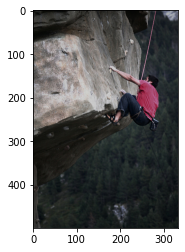

In [ ]:
plt.imshow(cv2.cvtColor(cv2.imread('Images/997722733_0cb5439472.jpg'),cv2.COLOR_BGR2RGB))

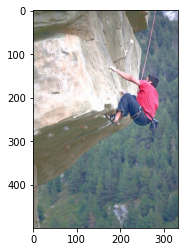

In [ ]:
plt.imshow(cv2.cvtColor(cv2.imread('/content/Images/997722733_0cb5439472_bright.jpg'),cv2.COLOR_BGR2RGB))

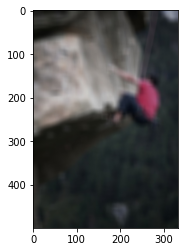

In [ ]:
plt.imshow(cv2.cvtColor(cv2.imread('/content/Images/997722733_0cb5439472_blur.jpg'),cv2.COLOR_BGR2RGB))

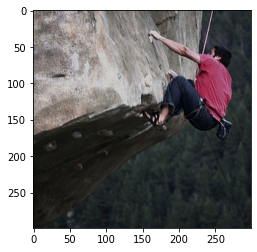

In [ ]:
plt.imshow(cv2.cvtColor(cv2.imread('/content/Images/997722733_0cb5439472_crop.jpg'),cv2.COLOR_BGR2RGB))

In [ ]:
cap_dict=dict()
for key in desc:
  cap_dict[key]=desc[key]
  cap_dict[key+'_crop']=desc[key]
  #cap_dict[key+'_blur']=desc[key]
  cap_dict[key+'_bright']=desc[key]
  
len(cap_dict)

24273

In [ ]:
data = pd.DataFrame(columns = ['image', 'caption'])
col1=list()
col2=list()
for key in cap_dict:
  for capt in cap_dict[key]:
    col1.append(key)
    col2.append(capt)
data['image']=col1
data['caption']=col2

In [ ]:
def get_vocab(data):
    #remove punctuations,adds start and end tokens ,split sentences to words
    data['clean_data'] = data['caption'].apply(lambda caption : ['<START>'] + [re.sub(r'[^\w\s]','',word).lower() if word.isalpha() else '' for word in caption.split(" ")] + ['<END>']) 
    #remove null strings
    for i in range(data.shape[0]):
        test_list=data['clean_data'][i]
        while('' in test_list) :
            test_list.remove('')
        data['clean_data'][i]=test_list
    #get the length of the longest caption
    maxLen=data.clean_data.map(len).max()
    #make all captions of equal length by adding (max length-sentence length) num pad tokens 
    data['clean_data']=data['clean_data'].apply(lambda text : text + ['<Aspace>']*(maxLen-len(text)) )
    #get the list of all words
    words=sorted(data['clean_data'].apply(lambda x : " ".join(x)).str.cat(sep = ' ').split(' '))
    #get the list of unique words and create vocabulary
    labels,vocab = pd.factorize(words)    
    return vocab

In [ ]:
vocab=get_vocab(data)
vocab_length=len(vocab)
#get the dictionaries of the form word: index number and index number:word
idx2word = {index: word for index, word in enumerate(vocab)}
word2idx = {word: index for index, word in enumerate(vocab)}
#save the dictionary
np.save("IndexToWord.npy",idx2word)
np.save("WordToIndex.npy",word2idx)
#get a sentence of where the words are replaced by their index numbers
data['seq']=data['clean_data'].apply( lambda capt : [word2idx[w] for w in capt] )
#sort dataframe by image_id
data = data.sort_values(by = 'image')
#divide the dataframe into train and test sets
train = data.iloc[:int(0.8*len(data))]
test = data.iloc[int(0.8*len(data)):]

In [ ]:
train

,image,caption,clean_data,seq
0,1000268201_693b08cb0e,A child in a pink dress is climbing up a set o...,"[<START>, a, child, in, a, pink, dress, is, cl...","[2, 3, 1331, 3653, 3, 5277, 2205, 3743, 1435, ..."
1,1000268201_693b08cb0e,A girl going into a wooden building .,"[<START>, a, girl, going, into, a, wooden, bui...","[2, 3, 3062, 3117, 3725, 3, 8255, 970, 1, 0, 0..."
2,1000268201_693b08cb0e,A little girl climbing into a wooden playhouse .,"[<START>, a, little, girl, climbing, into, a, ...","[2, 3, 4152, 3062, 1435, 3725, 3, 8255, 5340, ..."
3,1000268201_693b08cb0e,A little girl climbing the stairs to her playh...,"[<START>, a, little, girl, climbing, the, stai...","[2, 3, 4152, 3062, 1435, 7437, 6941, 7535, 343..."
4,1000268201_693b08cb0e,A little girl in a pink dress going into a woo...,"[<START>, a, little, girl, in, a, pink, dress,...","[2, 3, 4152, 3062, 3653, 3, 5277, 2205, 3117, ..."
...,...,...,...,...
97092,3601569729_bf4bf82768_bright,Jockeys on horses during a race .,"[<START>, jockeys, on, horses, during, a, race...","[2, 3798, 4811, 3548, 2276, 3, 5678, 1, 0, 0, ..."
97091,3601569729_bf4bf82768_bright,A horse race .,"[<START>, a, horse, race, <END>, <Aspace>, <As...","[2, 3, 3544, 5678, 1, 0, 0, 0, 0, 0, 0, 0, 0, ..."
97090,3601569729_bf4bf82768_bright,A group of race horses run down a track carryi...,"[<START>, a, group, of, race, horses, run, dow...","[2, 3, 3234, 4787, 5678, 3548, 6059, 2165, 3, ..."
97089,3601569729_bf4bf82768_crop,"There are riders and horses in a horse race , ...","[<START>, there, are, riders, and, horses, in,...","[2, 7446, 261, 5919, 184, 3548, 3653, 3, 3544,..."


# Loading the ResNet18 Model

In [ ]:
#loads cuda as the device being used
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
#download resNet18 from torchvision
resnet18 = torchvision.models.resnet18(pretrained=True).to(device)
resnet18.eval()
list(resnet18._modules)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


['conv1',
 'bn1',
 'relu',
 'maxpool',
 'layer1',
 'layer2',
 'layer3',
 'layer4',
 'avgpool',
 'fc']

In [ ]:
#get the layer4 of resNet18 
resNet18Layer4 = resnet18._modules.get('layer4').to(device)
resNet18Layer4

Sequential(
  (0): BasicBlock(
    (conv1): Conv2d(256, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (downsample): Sequential(
      (0): Conv2d(256, 512, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): BasicBlock(
    (conv1): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(512, eps=1

# Generate Image Embeddings

In [ ]:
 class transform_image():
    def __init__(self, data):
        self.data = data 
        self.scaler = transforms.Resize([224, 224])
        self.normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                     std=[0.229, 0.224, 0.225])
        self.to_tensor = transforms.ToTensor()
    def __len__(self):  
        return self.data.shape[0]

    def __getitem__(self,idx):

        image_name = self.data.iloc[idx]['image']
        img_loc = '/content/Images/'+str(image_name)+'.jpg'

        img = Image.open(img_loc)
        t_img = self.normalize(self.to_tensor(self.scaler(img)))

        return image_name, t_img

In [ ]:
def get_Embeddings_ResNet(df,fname):
  #get the unique images from the dataframe because each each image has 5 sets of captions in the dataframe
  unq_image=df[['image']].drop_duplicates()
  #resize and normalize the image using the transform_image() function
  Dataset_ResNet = transform_image(unq_image)
  #create a dataloader of the transformed images
  Dataloader = DataLoader(Dataset_ResNet, batch_size = 1, shuffle=False) 
  #initialise an empty dictionary where we will store embeddings in the form image id: embedding
  Extracted_resnet = {}
  for image_name, transformed_img in tqdm(Dataloader):
    #convert the tensor to variable (because transformed image function returns a tensor)
    transformed_img = Variable(transformed_img.to(device))
    #creating a tensor filled with 0s of size [1,512,7,7] in accordance to size of resnet18 layer 4
    emb = torch.zeros(1, 512, 7, 7)
    def copy_data(m, i, o):
        emb.copy_(o.data)   
    h = resNet18Layer4.register_forward_hook(copy_data)
    #feed forward the image through resNet
    resnet18(transformed_img) 
    h.remove()    
    #store the embedding generated in the dictionary
    Extracted_resnet[image_name[0]] = emb
  img_file = open(fname, "wb")
  #save the dictionary as a .pkl file
  pickle.dump(Extracted_resnet, img_file)
  img_file.close()
  #return the dictionary
  return Extracted_resnet

In [ ]:
train_resnet_encoded=get_Embeddings_ResNet(train,"./TrainImageResnetEncoded.pkl")
test_resnet_encoded=get_Embeddings_ResNet(test,"./TestImageResnetEncoded.pkl")

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


# Transformer Decoder

In [ ]:
class FlickerDataSetResnet():
    def __init__(self, data, pkl_file):
        self.data = data
        self.encodedImgs = pd.read_pickle(pkl_file)
    def __len__(self):
        return len(self.data)
    def __getitem__(self, idx):   
        caption_seq = self.data.iloc[idx]['seq']
        #left shifting the caption sequence by 1 timestep
        target_seq = caption_seq[1:]+[0]
        #stores image id in image_name
        image_name = self.data.iloc[idx]['image']
        #get the image encoding from the saved pkl file and store it in image_tensor
        image_tensor = self.encodedImgs[image_name] 
        #rearranges the original tensor according to the desired ordering and returns a new multidimensional rotated tensor
        image_tensor = image_tensor.permute(0,2,3,1)
        #Returns a new tensor with the same data as the self tensor but of a different shape.
        image_tensor_view = image_tensor.view(image_tensor.size(0), -1, image_tensor.size(3))
        return torch.tensor(caption_seq), torch.tensor(target_seq), image_tensor_view

In [ ]:
'''
>> Positional encoding is a re-representation of the values of a word and its position in a sentence
>> Positional encoder takes help of the cyclic nature of sin(x) and cos(x) functions 
   and returns information of the position of a word in a sentence
>> Positional Encoding(pos,2i)=sin(pos/10000^(2i/d))
   Positional Encoding(pos,2i+1)=cos(pos/10000^(2i/d))
   where 
   *pos is the position of the word
   *d is the size of the word embeding
   *i is the dimension of the embedding and can lie between [0,d-1] 

'''
class PositionalEncoding(nn.Module):
    def __init__(self, d_model, dropout=0.1, max_len=36):
        super(PositionalEncoding, self).__init__()
        self.dropout = nn.Dropout(p=dropout)
        pos_encoding = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        #get the positional encoding = sin(pos/10000^(2i/d)) and cos(pos/10000^(2i+1/d))
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))
        pos_encoding[:, 0::2] = torch.sin(position * div_term)
        pos_encoding[:, 1::2] = torch.cos(position * div_term)
        pos_encoding = pos_encoding.unsqueeze(0)
        self.register_buffer('pos_encoding', pos_encoding)
    def forward(self, x):
        if self.pos_encoding.size(0) < x.size(0):
            self.pos_encoding = self.pos_encoding.repeat(x.size(0), 1, 1).to(device)
        self.pos_encoding = self.pos_encoding[:x.size(0), : , : ]        
        x = x + self.pos_encoding
        return self.dropout(x)

In [ ]:
train_dataset_resnet = FlickerDataSetResnet(train, 'TrainImageResnetEncoded.pkl')
train_dataloader_resnet = DataLoader(train_dataset_resnet, batch_size = 32, shuffle=True)
test_dataset_resnet = FlickerDataSetResnet(test, 'TestImageResnetEncoded.pkl')
test_dataloader_resnet = DataLoader(test_dataset_resnet, batch_size = 32, shuffle=True)

In [ ]:
class ImageCaptionModel(nn.Module):
    def __init__(self, n_head, n_decoder_layer, vocab_size, embedding_size):
        super(ImageCaptionModel, self).__init__()
        self.pos_encoder = PositionalEncoding(embedding_size, 0.1)
        # d_model = embedding size , nhead = number of attention heads
        self.TransformerDecoderLayer = nn.TransformerDecoderLayer(d_model =  embedding_size, nhead = n_head) 
        self.TransformerDecoder = nn.TransformerDecoder(decoder_layer = self.TransformerDecoderLayer, num_layers = n_decoder_layer)
        self.embedding_size = embedding_size
        self.embedding = nn.Embedding(vocab_size , embedding_size)
        self.last_linear_layer = nn.Linear(embedding_size, vocab_size)
        self.init_weights()
    
    # initializing the weights of embedding layer from uniform distribution
    def init_weights(self):
         initrange = 0.1
         self.embedding.weight.data.uniform_(-initrange, initrange) 
         self.last_linear_layer.bias.data.zero_()
         self.last_linear_layer.weight.data.uniform_(-initrange, initrange) 

    # Padding mask is applied. The cross entropy loss will be masked during training at time steps where input token is <'Aspace'>.
    def generate_Mask(self, size, decoder_inp):
        decoder_input_mask = (torch.triu(torch.ones(size, size)) == 1).transpose(0, 1)
        decoder_input_mask = decoder_input_mask.float().masked_fill(decoder_input_mask == 0, float('-inf')).masked_fill(decoder_input_mask == 1, float(0.0))
        decoder_input_pad_mask = decoder_inp.float().masked_fill(decoder_inp == 0, float(0.0)).masked_fill(decoder_inp > 0, float(1.0))
        decoder_input_pad_mask_bool = decoder_inp == 0
        return decoder_input_mask, decoder_input_pad_mask, decoder_input_pad_mask_bool

    # Feed forward layers of the transformer decoder network
    def forward(self, encoded_image, decoder_inp):
        encoded_image = encoded_image.permute(1,0,2)
        

        decoder_inp_embed = self.embedding(decoder_inp)* math.sqrt(self.embedding_size)
        
        decoder_inp_embed = self.pos_encoder(decoder_inp_embed)
        decoder_inp_embed = decoder_inp_embed.permute(1,0,2)
        

        decoder_input_mask, decoder_input_pad_mask, decoder_input_pad_mask_bool = self.generate_Mask(decoder_inp.size(1), decoder_inp)
        decoder_input_mask = decoder_input_mask.to(device)
        decoder_input_pad_mask = decoder_input_pad_mask.to(device)
        decoder_input_pad_mask_bool = decoder_input_pad_mask_bool.to(device)
        

        decoder_output = self.TransformerDecoder(tgt = decoder_inp_embed, memory = encoded_image, tgt_mask = decoder_input_mask, tgt_key_padding_mask = decoder_input_pad_mask_bool)
        
        final_output = self.last_linear_layer(decoder_output)

        return final_output,  decoder_input_pad_mask


# Training the model

In [ ]:
''' The model is trained for 15 epochs. Adam optimization is used as optimizer and the loss metric is cross entropy loss.'''
EPOCH = 15
ictModel = ImageCaptionModel(16, 4, vocab_length, 512).to(device)
optimizer = torch.optim.Adam(ictModel.parameters(), lr = 0.00001)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, factor = 0.8, patience=1, verbose = True)
criterion = torch.nn.CrossEntropyLoss(reduction='none')
min_val_loss = np.float('Inf')

In [ ]:
# Instantiating tensorboard
tb = SummaryWriter()
network = ictModel
tb.close()

In [ ]:
for epoch in tqdm(range(EPOCH)):
    total_epoch_train_loss = 0
    total_epoch_valid_loss = 0
    total_train_words = 0
    total_valid_words = 0
    ictModel.train()

    ### Train Loop
    for caption_seq, target_seq, image_embed in train_dataloader_resnet:

        optimizer.zero_grad()

        image_embed = image_embed.squeeze(1).to(device)
        caption_seq = caption_seq.to(device)
        target_seq = target_seq.to(device)

        output, padding_mask = ictModel.forward(image_embed, caption_seq)
        output = output.permute(1, 2, 0)

        loss = criterion(output,target_seq)

        loss_masked = torch.mul(loss, padding_mask)

        final_batch_loss = torch.sum(loss_masked)/torch.sum(padding_mask)

        final_batch_loss.backward()
        optimizer.step()
        total_epoch_train_loss += torch.sum(loss_masked).detach().item()
        total_train_words += torch.sum(padding_mask)

 
    total_epoch_train_loss = total_epoch_train_loss/total_train_words
    tb.add_scalar('Train Loss',total_epoch_train_loss,epoch)
    ### Eval Loop
    ictModel.eval()
    with torch.no_grad():
        for caption_seq, target_seq, image_embed in test_dataloader_resnet:

            image_embed = image_embed.squeeze(1).to(device)
            caption_seq = caption_seq.to(device)
            target_seq = target_seq.to(device)

            output, padding_mask = ictModel.forward(image_embed, caption_seq)
            output = output.permute(1, 2, 0)

            loss = criterion(output,target_seq)

            loss_masked = torch.mul(loss, padding_mask)

            total_epoch_valid_loss += torch.sum(loss_masked).detach().item()
            total_valid_words += torch.sum(padding_mask)

    total_epoch_valid_loss = total_epoch_valid_loss/total_valid_words
    tb.add_scalar('Test Loss',total_epoch_valid_loss,epoch)
    print("Epoch -> ", epoch," Training Loss -> ", total_epoch_train_loss.item(), "Eval Loss -> ", total_epoch_valid_loss.item() )
    
    # The model weights get saved only when the test loss decreases
    if min_val_loss > total_epoch_valid_loss:
        print("Writing Model at epoch ", epoch)
        torch.save(ictModel, './BestModel')
        min_val_loss = total_epoch_valid_loss
  

    scheduler.step(total_epoch_valid_loss.item())
    

Epoch ->  0  Training Loss ->  4.201130390167236 Eval Loss ->  3.53871488571167
Writing Model at epoch  0
Epoch ->  1  Training Loss ->  3.3270606994628906 Eval Loss ->  3.255120277404785
Writing Model at epoch  1
Epoch ->  2  Training Loss ->  3.04933500289917 Eval Loss ->  3.1100714206695557
Writing Model at epoch  2
Epoch ->  3  Training Loss ->  2.8647916316986084 Eval Loss ->  3.0285208225250244
Writing Model at epoch  3
Epoch ->  4  Training Loss ->  2.724397659301758 Eval Loss ->  2.9749608039855957
Writing Model at epoch  4
Epoch ->  5  Training Loss ->  2.607008218765259 Eval Loss ->  2.936985492706299
Writing Model at epoch  5
Epoch ->  6  Training Loss ->  2.506622076034546 Eval Loss ->  2.9101247787475586
Writing Model at epoch  6
Epoch ->  7  Training Loss ->  2.417088031768799 Eval Loss ->  2.891556739807129
Writing Model at epoch  7
Epoch ->  8  Training Loss ->  2.3338921070098877 Eval Loss ->  2.885288715362549
Writing Model at epoch  8
Epoch ->  9  Training Loss ->  2

# Visualising Loss curves using TensorBoard

In [ ]:
# Visualising Loss curves using TensorBoard
tb.close()
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [ ]:
!unzip gdrive/My\ Drive/Dataset/BestModel

Archive:  gdrive/My Drive/Dataset/BestModel
 extracting: archive/data.pkl        
 extracting: archive/data/0          
 extracting: archive/data/1          
 extracting: archive/data/10         
 extracting: archive/data/11         
 extracting: archive/data/12         
 extracting: archive/data/13         
 extracting: archive/data/14         
 extracting: archive/data/15         
 extracting: archive/data/16         
 extracting: archive/data/17         
 extracting: archive/data/18         
 extracting: archive/data/19         
 extracting: archive/data/2          
 extracting: archive/data/20         
 extracting: archive/data/21         
 extracting: archive/data/22         
 extracting: archive/data/23         
 extracting: archive/data/24         
 extracting: archive/data/25         
 extracting: archive/data/26         
 extracting: archive/data/27         
 extracting: archive/data/28         
 extracting: archive/data/29         
 extracting: archive/data/3          
 extra

# Generate Captions for the images from test set

In [ ]:
import random
model = torch.load('./BestModel')
start_token = word2idx['<START>']
end_token = word2idx['<END>']
pad_token = word2idx['<Aspace>']
max_seq_len = 36
valid_img_embed = pd.read_pickle('TestImageResnetEncoded.pkl')
# The below function generates captions for the images from test set
def generate_caption(K, img_nm): 
    img_loc = '/content/Images/'+str(img_nm)+'.jpg'
    image = Image.open(img_loc).convert("RGB")
    plt.imshow(image)

    model.eval() 
    # getting the actual caption for test image
    valid_img_df = test[test['image']==img_nm]   
    print("Actual Caption : ")
    print(valid_img_df['caption'].tolist())

    #getting the image encodings from Test encoding file saved earlier.
    img_embed = valid_img_embed[img_nm].to(device)


    img_embed = img_embed.permute(0,2,3,1)
    img_embed = img_embed.view(img_embed.size(0), -1, img_embed.size(3))

    # Preparing the input sequence to be fed in the model
    input_seq = [pad_token]*max_seq_len
    input_seq[0] = start_token

    input_seq = torch.tensor(input_seq).unsqueeze(0).to(device)
    predicted_sentence = []
    with torch.no_grad():
        for eval_iter in range(0, max_seq_len-1):
            # Feeding the image embeddings and input sequence into the model and getting the output
            output, padding_mask = model.forward(img_embed, input_seq)

            output = output[eval_iter, 0, :]
            
            # Predicts the top K captions for the test image
            values = torch.topk(output, K).values.tolist()
            indices = torch.topk(output, K).indices.tolist()

            next_word_index = random.choices(indices, values, k = 1)[0]

            next_word = idx2word[next_word_index]

            input_seq[:, eval_iter+1] = next_word_index


            if next_word == '<END>' :
                break

            predicted_sentence.append(next_word)
    print("\n")
    print("Predicted caption : ")
    print(" ".join(predicted_sentence+['.']))


# Generate captions for custom user fed images

In [ ]:
import random
#model = torch.load('/content/gdrive/MyDrive/Dataset/BestModel')
model = torch.load('./BestModel')
start_token = word2idx['<START>']
end_token = word2idx['<END>']
pad_token = word2idx['<Aspace>']
max_seq_len = 36

def custom_img_predict(K,fname):
  img_loc = '/content/Images/'+str(fname)
  image = Image.open(img_loc).convert("RGB")
  plt.imshow(image)

  model.eval()
  # Converting the custom img name to dataframe to feed into ResNet18 dataloader and get the embeddings
  data = {'image':[str(fname)]}
  df = pd.DataFrame(data)
  emb = get_Embeddings_ResNet(df,"new_image_encoded.pkl")
  # Saving the encodings in .pkl file
  valid_img_embed = pd.read_pickle('new_image_encoded.pkl')

  #getting the image encodings from encoding file saved earlier.
  img_embed = valid_img_embed[fname].to(device)
  img_embed = img_embed.permute(0,2,3,1)
  img_embed = img_embed.view(img_embed.size(0), -1, img_embed.size(3))
  
  # Preparing the input sequence to be fed in the model
  input_seq = [pad_token]*max_seq_len
  input_seq[0] = start_token

  input_seq = torch.tensor(input_seq).unsqueeze(0).to(device)
  predicted_sentence = []
  with torch.no_grad():
      for eval_iter in range(0, max_seq_len-1):
          # Feeding the image embeddings and input sequence into the model and getting the output
          output, padding_mask = model.forward(img_embed, input_seq)

          output = output[eval_iter, 0, :]
          
          # Predicts the top K captions for the custom image
          values = torch.topk(output, K).values.tolist()
          indices = torch.topk(output, K).indices.tolist()

          next_word_index = random.choices(indices, values, k = 1)[0]

          next_word = idx2word[next_word_index]

          input_seq[:, eval_iter+1] = next_word_index


          if next_word == '<END>' :
              break

          predicted_sentence.append(next_word)
  #print("\n")
  #print("Predicted caption : ")
  #print(" ".join(predicted_sentence+['.']))
  return " ".join(predicted_sentence+['.'])

Actual Caption : 
['Two men standing near a metal structure in from of a brick wall .', 'a man leans against a large robot .', 'Two men are standing under a large work of art by a brick building .', 'Two men are standing under what looks to be a giant robot .', 'Two men standing at the feet of a large sculpture .']


Predicted caption : 
a boy in a blue shirt is being held by a boy in a blue shirt .


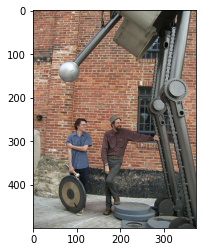

In [ ]:
generate_caption(1, test.iloc[35]['image'])

Actual Caption : 
['A biker makes a high jump .', 'A man doing an aerial stunt on a bike .', 'A man on a bicycle performing a jump .', 'A person on a bicycle wears a helmet and jumps , soaring over the ground in front of a skyline and lake .', 'The cyclist is making a high jump with his bike .']


Predicted caption : 
a man in a blue uniform is airborne on a bike .


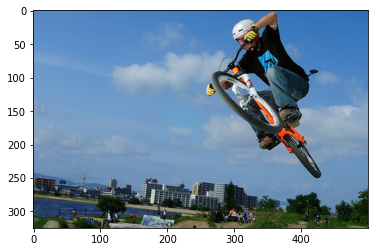

In [ ]:
generate_caption(1, test.iloc[50]['image'])

Actual Caption : 
['A person on a bicycle wears a helmet and jumps , soaring over the ground in front of a skyline and lake .', 'A man on a bicycle performing a jump .', 'A man doing an aerial stunt on a bike .', 'A biker makes a high jump .', 'The cyclist is making a high jump with his bike .']


Predicted caption : 
a skateboarder in midair .


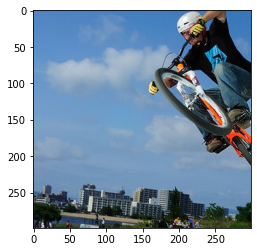

In [ ]:
generate_caption(1, test.iloc[60]['image'])

Actual Caption : 
['A little girl is standing next to another little girl who is taking a photograph .', 'Child taking a picture while sister leans on the wall .', 'A small boy and small girl setting up a camera', 'A child uses a camera as another child looks on .', 'One child behind a camera on a tripod with one child in a beige shirt and black shorts standing against the wall .']


Predicted caption : 
a woman and a man are standing on a cellphone with a camera .


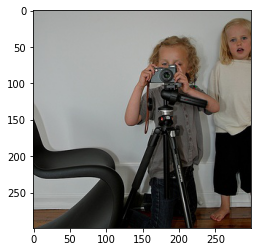

In [ ]:
generate_caption(1, test.iloc[90]['image'])

Actual Caption : 
['Man looking very exciting holding headphones standing outside next to a woman .', 'Man and woman looking surprised , with the man holding headphones .', 'A woman and a man are amused by headphones .', 'an excited couple reaching for a large black set of earphones', 'A man with headphones has his mouth wide open while a woman stands next to him .']


Predicted caption : 
a young girl in a pink shirt is smiling while another boy looks on .


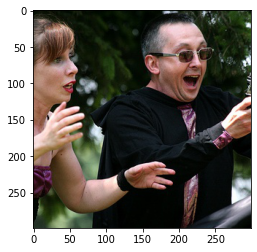

In [ ]:
generate_caption(1, test.iloc[167]['image'])

Actual Caption : 
['A man in a white jacket and helmet does tricks on his bike .', 'A man is performing a midair stunt on a dirt bike while people in the background watch .', 'A dirt biker competes while onlookers watch .', 'A bicyclist jumps their bike while a crowd spread across a hillside watches .', 'A mountain bike racer jumps his bike as spectators watch .']


Predicted caption : 
a man on a bike is riding on a bike .


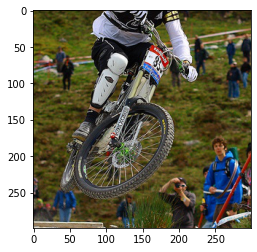

In [ ]:
generate_caption(1, test.iloc[298]['image'])

Actual Caption : 
['A dirt biker competes while onlookers watch .', 'A man is performing a midair stunt on a dirt bike while people in the background watch .', 'A man in a white jacket and helmet does tricks on his bike .', 'A mountain bike racer jumps his bike as spectators watch .', 'A bicyclist jumps their bike while a crowd spread across a hillside watches .']


Predicted caption : 
a man is riding a bike on a dirt path .


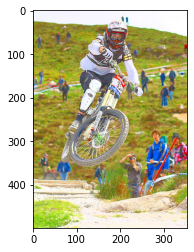

In [ ]:
generate_caption(1, test.iloc[297]['image'])

Actual Caption : 
['The boy laughed as he swam in the pool .', 'Children play in an inflatable pool .', 'A young boy plays around in a jacuzzi .', 'A boy with a beach ball behind him playing in a pool', 'Two children are in a pool with a beach ball floating nearby .']


Predicted caption : 
a boy in a green shirt is jumping into a pool .


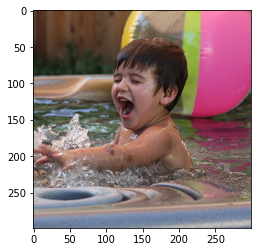

In [ ]:
generate_caption(1, test.iloc[285]['image'])

Actual Caption : 
['Two children are in a pool with a beach ball floating nearby .', 'The boy laughed as he swam in the pool .', 'Children play in an inflatable pool .', 'A young boy plays around in a jacuzzi .', 'A boy with a beach ball behind him playing in a pool']


Predicted caption : 
a boy and a girl are playing in a pool .


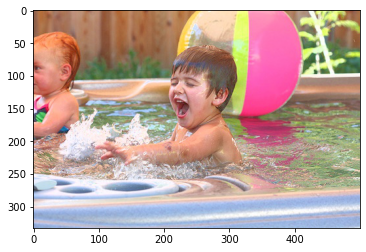

In [ ]:
generate_caption(1, test.iloc[280]['image'])

Actual Caption : 
['A big dog barking at a small dog through a fence .', 'A brown and white dog barking through the fence at smaller black and white dog .', 'The big dog is looking through the fence at the small dog .', 'The larger dog is barking at the smaller dog .', 'Two dogs fighting with a fence between them .']


Predicted caption : 
two dogs are playing in a grassy area .


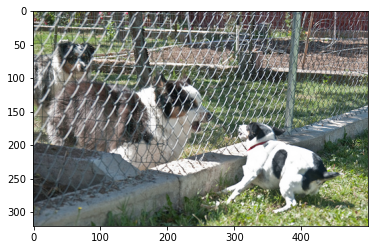

In [ ]:
generate_caption(1, test.iloc[261]['image'])

Actual Caption : 
['Children , one with a stick , and six petting a dog with a blue leash .', 'A group of children are petting a white dog on the grass .', 'A group of children gather around a white dog on the grass outside .', 'a group of children playing with a dog', 'Group of children surround and pet white dog with blue collar on grass .']


Predicted caption : 
two boys are playing with a small dog .


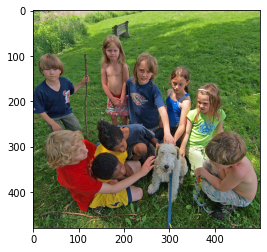

In [ ]:
generate_caption(1, test.iloc[247]['image'])

Actual Caption : 
['Two people swimming on a floating while a black dog follows .', 'Two people swimming in water with a black dog trailing behind them .', 'Two people and a dog play in the water using a blue inflatable toy .', 'Black dog swims behind two people on an inflatable blue raft .', 'A child floating on a blue raft while a woman holds on to him while a black dog swims nearby .']


Predicted caption : 
a man in a red shirt is surfing on the ocean .


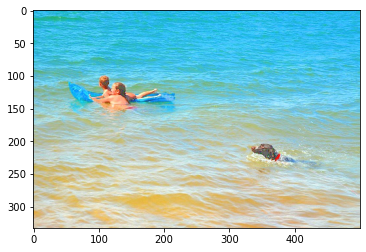

In [ ]:
generate_caption(1, test.iloc[233]['image'])


Predicted Caption: a man in a black shirt and white shirt is running through a grassy area .



Predicted Caption: a person in black and white shorts and black shorts is walking through a grassy field .



Predicted Caption: a person in black shorts stands in front of a brick brick wall and a white fence with a blue sky and a man in his hand in front of a black pants and black .



Predicted Caption: two boys playing with a tennis ball in front of an obstacle .



Predicted Caption: the little girl wearing a yellow shirt runs on the ground with his hands through the woods behind it and the air .


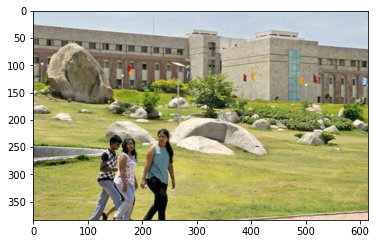

In [ ]:
for i in range(1,6):
  print("Predicted Caption: "+ custom_img_predict(i,"BITS-PILANI-HYD-CAMPUSjpg.jpg"))



# Helper Functions of Data Augmentation

In [ ]:
def center_crop(desc):
	"""Returns center cropped image
	Args:
	img: image to be center cropped
	dim: dimensions (width, height) to be cropped
	"""
  for key in desc:
    img = cv2.imread('/content/Images/'+key+'.jpg')
    width, height = img.shape[1], img.shape[0]
    crop_width = img.shape[1]
	  crop_height = img.shape[0] 
	  mid_x, mid_y = int(width/2), int(height/2)
	  cw2, ch2 = int(crop_width/2), int(crop_height/2) 
	  crop_img = img[mid_y-ch2:mid_y+ch2, mid_x-cw2:mid_x+cw2]
    crop_img = cv2.cvtColor(crop_img, cv2.COLOR_BGR2RGB)
    cv2.imwrite('/content/Images/'+key+'_crop'+'.jpg',rotate_image)

center_crop(desc)


In [ ]:
def resize_image(desc):
  TARGET = (299,299)
  for key in desc:
    img = cv2.imread('/content/Images/'+key+'.jpg')
    resized_img = cv2.resize(img, dsize = (299,299), interpolation=cv2.INTER_CUBIC)
    cv2.imwrite('/content/Images/'+key+'_resize'+'.jpg',resized_img)
    
resize_image(desc)

In [ ]:
import random
def image_flip_augment_dict(desc):
  for key in desc:
    img = cv2.imread('/content/Images/'+key+'_resize'+'.jpg')
    flip_image = cv2.flip(img,random.randint(-1, 1))
    cv2.imwrite('/content/Images/'+key+'_flip'+'.jpg',flip_image)
    
image_flip_augment_dict(desc)

In [ ]:
def image_rotate_augment_dict(desc):
  for key in desc:
    img = cv2.imread('/content/Images/'+key+'_resize'+'.jpg')
    rows, columns = img.shape[:2]
    random_angle = random.randint(-180,180)
    rotate_matrix = cv2.getRotationMatrix2D((columns/2,rows/2), random_angle,1)
    rotate_image = cv2.warpAffine(img, rotate_matrix, (columns, rows))
    cv2.imwrite('/content/Images/'+key+'_rotate'+'.jpg',rotate_image)
    
image_rotate_augment_dict(desc)

In [ ]:
def image_noise_augment_dict(desc):
  for key in desc:
    img = cv2.imread('/content/Images/'+key+'_resize'+'.jpg')
    rows, cols = img.shape[:2]
    aug_img = cv2.cvtColor(img, cv2.COLOR_RGB2HSV) # transform to HSV color space .
    h, s, v = cv2.split(aug_img) # split each channel in order to add seperate range of values to each channel.
    h += np.random.randint(0, 100,size=(rows, cols), dtype=np.uint8 )
    s += np.random.randint(0, 20,size=(rows, cols), dtype=np.uint8 )
    v += np.random.randint(0, 10,size=(rows, cols) , dtype=np.uint8 )
    aug_img = cv2.merge([h,s,v ])
    noise_image = cv2.cvtColor(aug_img, cv2.COLOR_HSV2RGB)
    cv2.imwrite('/content/Images/'+key+'_noise'+'.jpg',noise_image)
    #image_noise_dict[key] = noise_image
  #return image_noise_dict
image_noise_augment_dict(desc)

In [ ]:
def image_blur_augment_dict(desc):
  for key in desc:
    img = cv2.imread('/content/Images/'+key+'_resize'+'.jpg')
    blur_value = random.randint(5,15)
    blur_image = cv2.blur(img,(blur_value,blur_value))
    blur_image = cv2.cvtColor(blur_image, cv2.COLOR_BGR2RGB)
    cv2.imwrite('/content/Images/'+key+'_blur'+'.jpg',blur_image)
    #image_blur_dict[key] = blur_image
  #return image_blur_dict
image_blur_dict = image_blur_augment_dict(desc)